# Analyzing Shooting Forms of NBA Players with Pose Estimation
### Faizan Ahmed

### CUS 1194

This project is for the purpose of applying computer vision techniques to optimize the shooting forms of NBA players, which is of upmost importance for teams today. In this notebook, I analyze the forms of Stephen Curry, Giannis Antetokounmpo, and DeMar DeRozan.

Stephen Curry is widely regarded as one of the best 3 point shooters of all time, with a career 3 point percent average of 43.5%, where just 40% is regarded as elite in the NBA. I wanted to compare Curry's shooting form to players who struggle from the 3 point line, where Giannis Antetokounmpo shoots an average of 28.4% from 3 for his career and DeMar DeRozan shoots 28.2% for his career. 

Player Stats can be found here:

**Stephen Curry:** https://www.basketball-reference.com/players/c/curryst01.html

**Giannis Antetokounmpo**: https://www.basketball-reference.com/players/a/antetgi01.html

**DeMar DeRozan**: https://www.basketball-reference.com/players/d/derozde01.html

In [1]:
import cv2
import time
import numpy as np
import matplotlib.pyplot as plt
import math
%matplotlib inline

In [2]:
# Specify the paths for the 2 files
protoFile = "/Users/faizanahmed/learnopencv/OpenPose/pose/mpi/pose_deploy_linevec_faster_4_stages.prototxt"
weightsFile = "/Users/faizanahmed/learnopencv/OpenPose/pose/mpi/pose_iter_160000.caffemodel"
POSE_PAIRS = [[0,1], [1,2], [2,3], [3,4], [1,5], [5,6], [6,7], [1,14], [14,8], [8,9], [9,10], [14,11], [11,12], [12,13] ]

# Read the network into Memory
net = cv2.dnn.readNetFromCaffe(protoFile, weightsFile)

### Function to apply Pose Estimation and draw skeleton over keypoints 
### Returns the angle between specified keypoints

In [23]:
def getPoseEstimation(img, threshold, pointsOfFocus, showImg=True, inverse=False):
    
    frame = cv2.imread("img/" + img + ".jpg")

    frameCopy = np.copy(frame)
    frameWidth = frame.shape[1]
    frameHeight = frame.shape[0]
    
    keyPoints = []

    # Specify the input image dimensions
    inWidth = 368
    inHeight = 368

    # Prepare the frame to be fed to the network
    inpBlob = cv2.dnn.blobFromImage(frame, 1.0 / 255, (inWidth, inHeight), (0, 0, 0), swapRB=False, crop=False)

    # Set the prepared object as the input blob of the network
    net.setInput(inpBlob)

    output = net.forward()

    H = output.shape[2]
    W = output.shape[3]

    nPoints = 15
    
    # Empty list to store the detected keypoints
    points = []

    for i in range(nPoints):
        # confidence map of corresponding body's part.
        probMap = output[0, i, :, :]

        # Find global maxima of the probMap.
        minVal, prob, minLoc, point = cv2.minMaxLoc(probMap)

        # Scale the point to fit on the original image
        x = (frameWidth * point[0]) / W
        y = (frameHeight * point[1]) / H

        if prob > threshold : 
            cv2.circle(frameCopy, (int(x), int(y)), 8, (0, 255, 255), thickness=-1, lineType=cv2.FILLED)
            cv2.putText(frameCopy, "{}".format(i), (int(x), int(y)), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 0, 255), 2, lineType=cv2.LINE_AA)
            cv2.circle(frame, (int(x), int(y)), 8, (0, 0, 255), thickness=-1, lineType=cv2.FILLED)
           

            # Add the point to the list if the probability is greater than the threshold
            points.append((int(x), int(y)))
            
            if i in pointsOfFocus:
                keyPoints.append([int(x), int(y), i])
            
        else :
            points.append(None)

    # Draw Skeleton
    for pair in POSE_PAIRS:
        partA = pair[0]
        partB = pair[1]

        if points[partA] and points[partB]:
            cv2.line(frame, points[partA], points[partB], (0, 255, 255), 3)
    
    if showImg == True:
        
        plt.figure()
        plt.figure(figsize=[30,30])
        plt.subplot(1,2,1),plt.imshow(cv2.cvtColor(frameCopy, cv2.COLOR_BGR2RGB))
        plt.subplot(1,2,2),plt.imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))

        
    if pointsOfFocus[1] != keyPoints[1][2]:
        
        if pointsOfFocus[1] == keyPoints[0][2]:
            keyPoints[0], keyPoints[1] = keyPoints[1],keyPoints[0]
            
        elif pointsOfFocus[1] == keyPoints[2][2]:
            keyPoints[2], keyPoints[1] = keyPoints[1],keyPoints[2]
        
        
    print('\n' + img, 'Key Points:', keyPoints)
    
    calcAngle = calculateAngle(keyPoints)
    
    if inverse == True:
        calcAngle = 360 - calcAngle 
        
    print(str(calcAngle)[0 : 6], 'Degree Angle')
    return keyPoints
    

def calculateAngle(points):
    #ang = math.degrees(math.atan2(c[1]-b[1], c[0]-b[0]) - math.atan2(a[1]-b[1], a[0]-b[0]))
    ang = math.degrees(math.atan2(points[2][1] - points[1][1], points[2][0] - points[1][0]) - math.atan2(points[0][1] - points[1][1], points[0][0] - points[1][0]))
    return ang + 360 if ang < 0 else ang


# 1) Analysis of Players' Form Pre-Release

Before the player jumps to release the ball, they have to get in the right stance to do so. The way you hold the ball before you release it is crucial, as it can make or break your shooting form. Here, we apply pose estimation to find the angle between Stephen Curry's right shoulder and right wrist, as denoted below by the numbers 2, 3, and 7, circled in blue:

<img src="img/curryStanceAngle2.jpg">
<img src="img/curryStanceAngle.jpg">

<img src="img/giannisStanceAngle2.jpg"> 
<img src="img/giannisStanceAngle.jpg"> 



### Applying Pose Estimation 

Here, we see that Giannis and DeMar hold the ball at a much lower position than Curry, causing them to have a greater angle between their right shoulder and wrist compared to Curry, whose angle is 64.72 degrees. This is important to note because this can greatly alter Giannis' and DeMar's jumpshot, due to the position in which they grip the ball which can potentially hinder their shooting accuracy. 


curry1 Key Points: [[110, 137, 2], [84, 224, 3], [163, 212, 7]]
64.724 Degree Angle

giannis1 Key Points: [[563, 158, 2], [535, 269, 3], [704, 301, 7]]
86.564 Degree Angle

demar1 Key Points: [[115, 239, 2], [70, 385, 3], [133, 425, 4]]
105.28 Degree Angle


<Figure size 432x288 with 0 Axes>

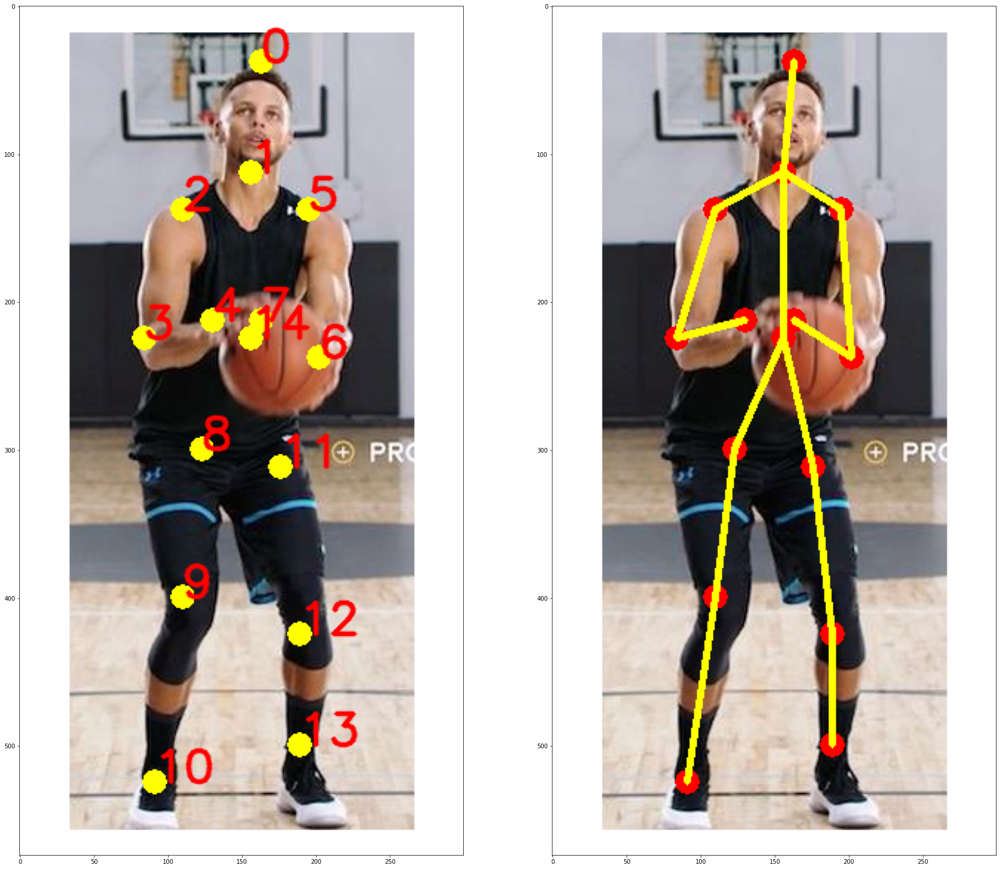

<Figure size 432x288 with 0 Axes>

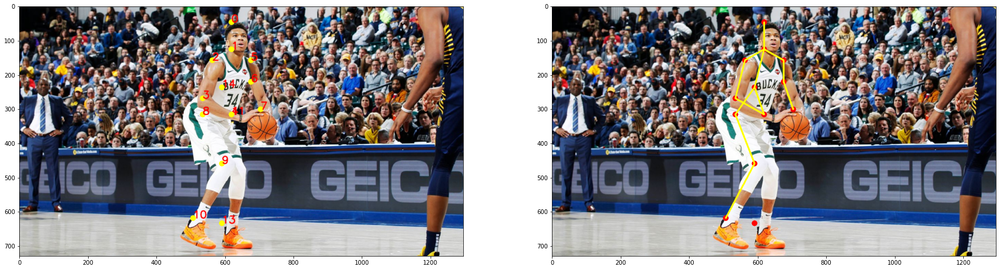

<Figure size 432x288 with 0 Axes>

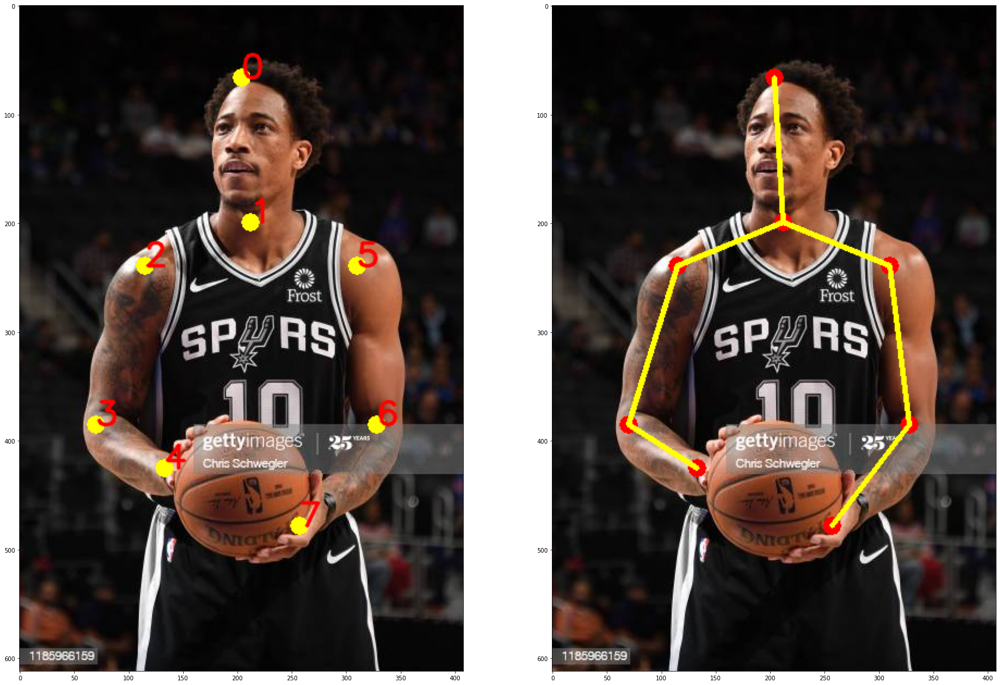

In [24]:
keyPoints = getPoseEstimation("curry1", 0.1, [2,3,7])
keyPoints = getPoseEstimation("giannis1", 0.4, [2,3,7])
keyPoints = getPoseEstimation("demar1", 0.2, [2,3,4])

# 2) Analyzing the Jumpshot

Here, I analyze the same keypoints to calculate the angle between the players' shoulder and wrist while they are at the peak of their jumpshot, which is a critical point to analyze as it the moment right before the player releases the ball. Having the right angle here is especially important because the release of the ball needs to have the right arch and angle in order enter the basket and not result in a missed shot. 

In this analysis, we are looking at points 2, 3, and 7 for the angle the represents the players' arm & elbow, along with the points 14, 2, and 3, which represents how high or low the players' arm is. Lastly, the angle that approximates the basketball's release angle is calculcated from points 7, 2, and 3. This is denoted by the green circles:

<img src="img/curryShotAngle2.jpg">
<img src="img/curryShotAngle.jpg">


#### Here, the first angle that is printed for each player represents the blue marking from above. The second angle printed represents the green marking above

What we can see from these results is that each player has similar shooting forms, where their respective shooting angles are not that much different than one another. However, we can see that Giannis and DeRozan should adjust their shooting form to get their arms up higher, as noted by their angles representing points 14, 2 and 3 for Giannis and 14, 2 and 4 for DeRozan, since Curry's shooting angle was greater than both of theirs. 


curry12 Key Points: [[250, 152, 2], [313, 137, 3], [288, 79, 7]]
80.074 Degree Angle

curry12 Key Points: [[313, 137, 3], [250, 152, 2], [225, 231, 14]]
120.95 Degree Angle

curry12 Key Points: [[313, 137, 3], [250, 152, 2], [288, 79, 7]]
49.108 Degree Angle

giannis1.1 Key Points: [[543, 445, 2], [760, 361, 3], [565, 111, 7]]
73.207 Degree Angle

giannis1.1 Key Points: [[760, 361, 3], [543, 445, 2], [543, 640, 14]]
111.16 Degree Angle

giannis1.1 Key Points: [[760, 361, 3], [543, 445, 2], [565, 111, 7]]
65.070 Degree Angle

demar8 Key Points: [[521, 646, 2], [782, 549, 4], [678, 323, 12]]
85.676 Degree Angle

demar8 Key Points: [[782, 549, 4], [521, 646, 2], [495, 969, 14]]
114.98 Degree Angle

demar8 Key Points: [[782, 549, 4], [521, 646, 2], [678, 323, 12]]
43.689 Degree Angle


<Figure size 432x288 with 0 Axes>

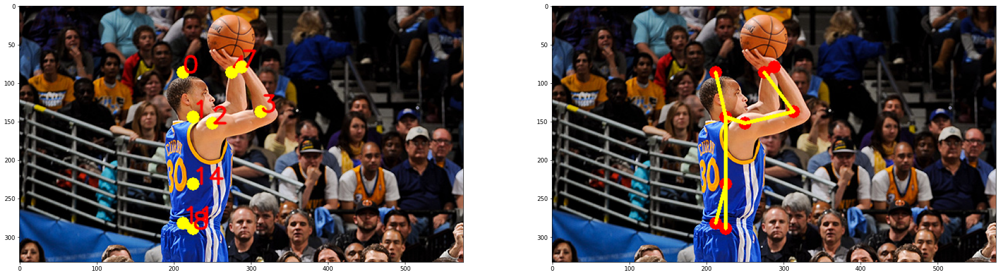

<Figure size 432x288 with 0 Axes>

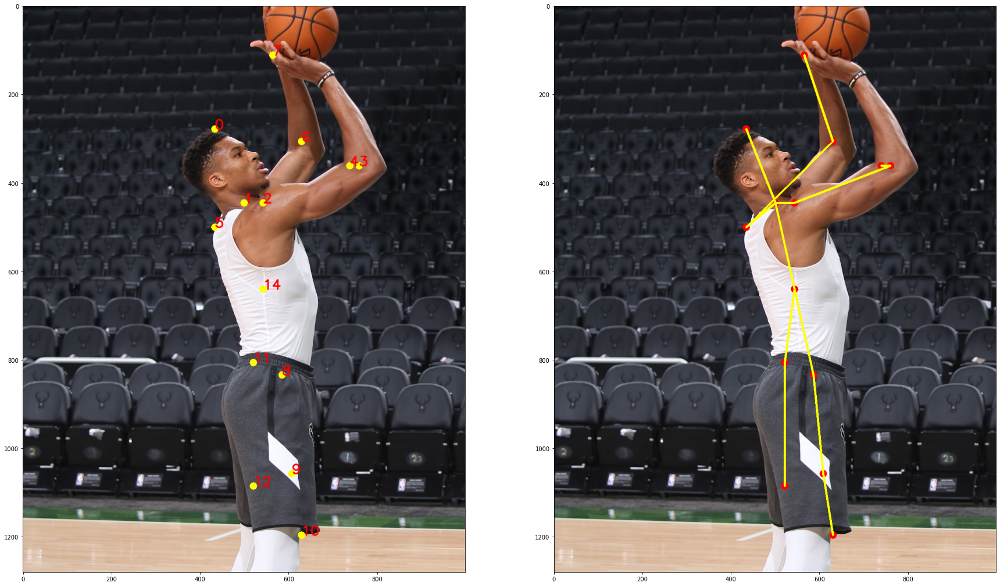

<Figure size 432x288 with 0 Axes>

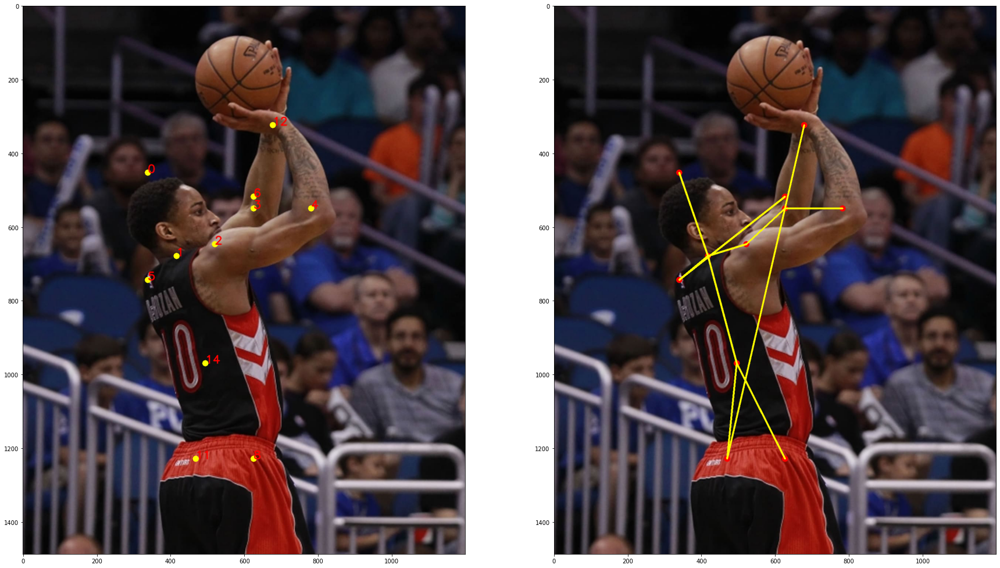

In [25]:
keyPoints = getPoseEstimation("curry12", 0.3, [2,3,7])
keyPoints = getPoseEstimation("curry12", 0.3, [14,2,3], False)
keyPoints = getPoseEstimation("curry12", 0.3, [7,2,3], False, True)

keyPoints = getPoseEstimation("giannis1.1", 0.1, [2,3,7])
keyPoints = getPoseEstimation("giannis1.1", 0.1, [14,2,3], False)
keyPoints = getPoseEstimation("giannis1.1", 0.1, [7,2,3], False, True)

keyPoints = getPoseEstimation("demar8", 0.3, [2,4,12])
keyPoints = getPoseEstimation("demar8", 0.3, [14,2,4], False)
keyPoints = getPoseEstimation("demar8", 0.3, [12,2,4], False, True)

# 3) Analyzing the Jumpshot 2

Here, I wanted to analyze the players' jumpshot from a different angle. The points I wanted to use are 2, 3, and 4 and the angle they form with the elbow, as denoted by the green circles:

<img src="img/curryShotAngle3.jpg">
<img src="img/curryShotAngle4.jpg">

Here, we can note that both Giannis and DeRozan's angles are less than Curry's. This is most likely due to them not bringing the ball close enough to their head. By brining the ball closer, it would give you more power and aim when you release the ball, which could explain why Curry's angle is greater than theirs


curry11 Key Points: [[175, 194, 2], [148, 194, 3], [175, 152, 4]]
57.264 Degree Angle

giannis10 Key Points: [[869, 1020, 5], [695, 881, 6], [826, 602, 7]]
103.46 Degree Angle

demar5 Key Points: [[1331, 1198, 2], [1131, 998, 3], [1331, 699, 4]]
101.22 Degree Angle


<Figure size 432x288 with 0 Axes>

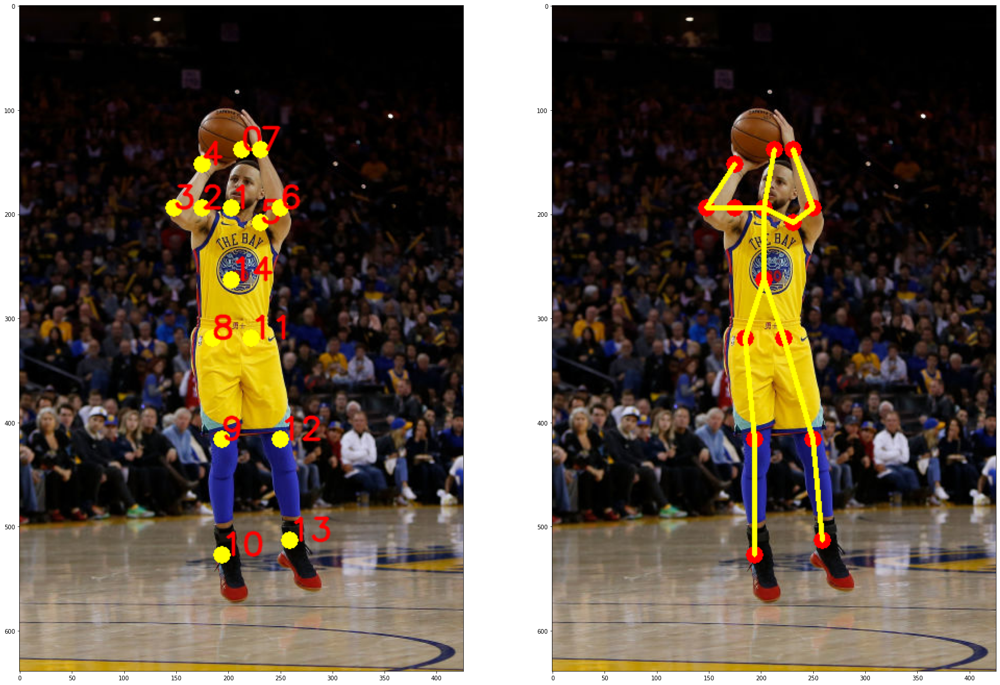

<Figure size 432x288 with 0 Axes>

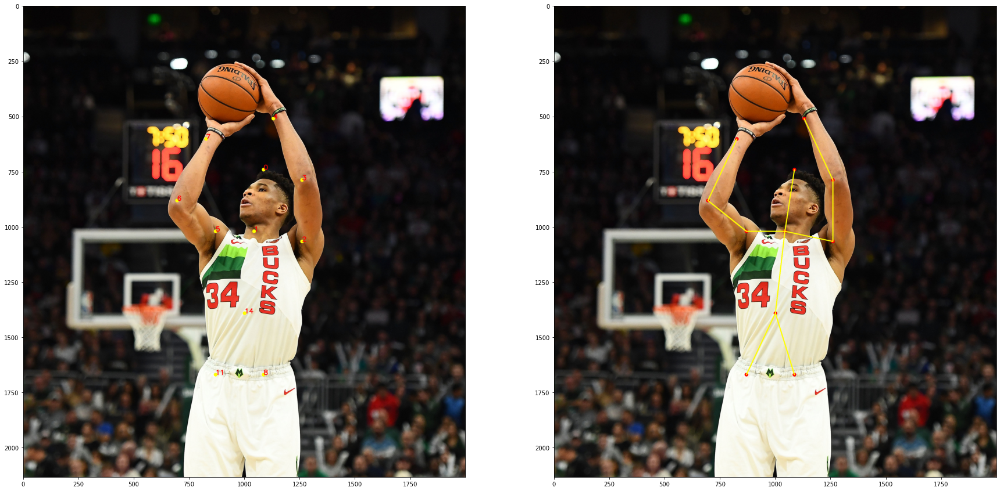

<Figure size 432x288 with 0 Axes>

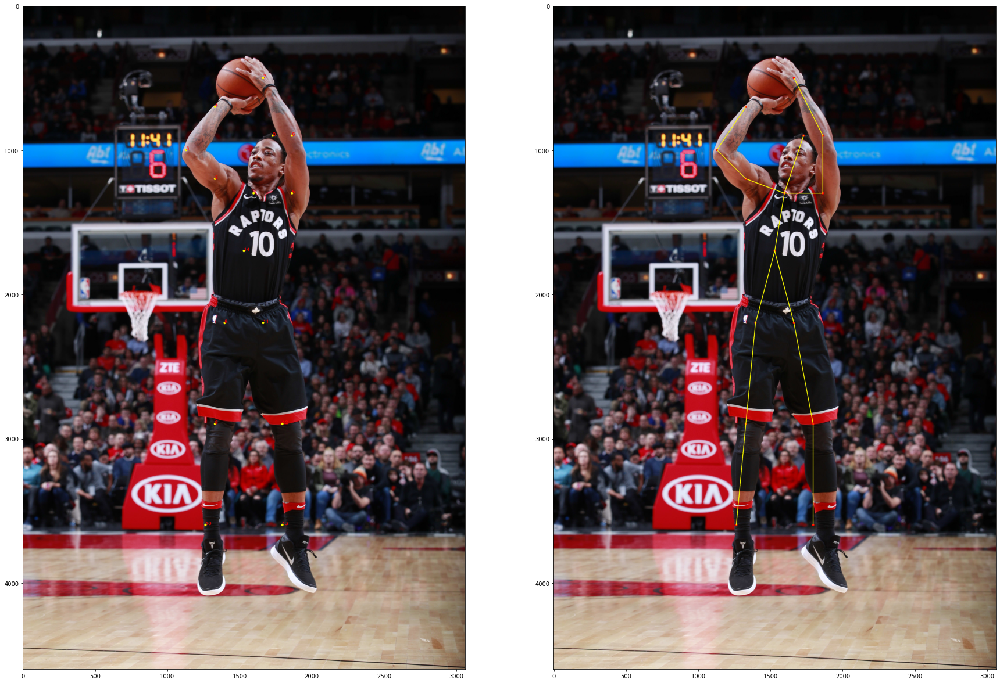

In [26]:
keyPoints = getPoseEstimation("curry11", 0.1, [2,3,4], True, True)
keyPoints = getPoseEstimation("giannis10", 0.1, [5,6,7], True, True)
keyPoints = getPoseEstimation("demar5", 0.1, [2,3,4], True, True)

# 4) Analyzing the Release

Here, I wanted to analyze exactly how the players release the ball and see the angle in which they do. This would precisely determine the ball's trajectory towards the basket.

<img src="img/curryShotAngle5.jpg">
<img src="img/curryShotAngle6.jpg">


Here, we can see that each player is similar in their releases, but it seems as DeRozan should aim to bend his elbow a bit more in order to mimic Curry's release where his elbow is slightly bent


curry5 Key Points: [[175, 186, 2], [150, 146, 3], [166, 79, 4]]
225.43 Degree Angle

giannis11 Key Points: [[78, 263, 2], [60, 210, 3], [86, 126, 4]]
215.95 Degree Angle

demar10 Key Points: [[208, 215, 2], [217, 155, 3], [226, 83, 4]]
178.59 Degree Angle


<Figure size 432x288 with 0 Axes>

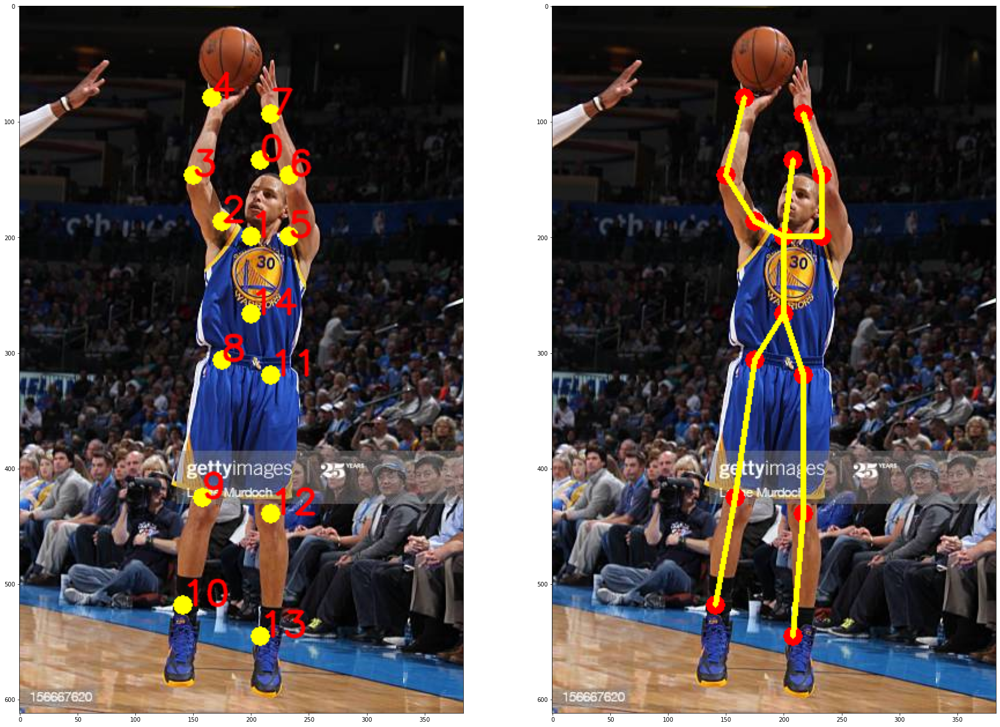

<Figure size 432x288 with 0 Axes>

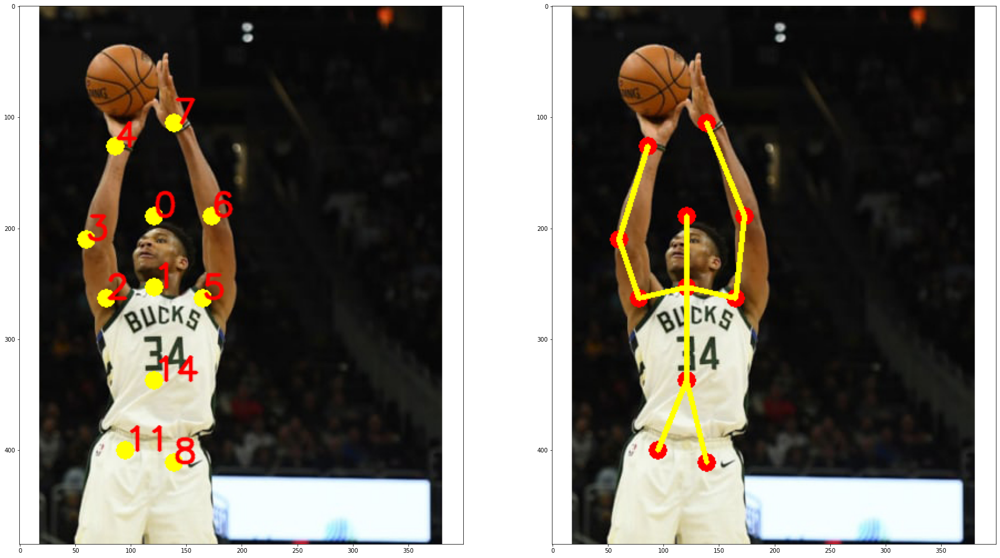

<Figure size 432x288 with 0 Axes>

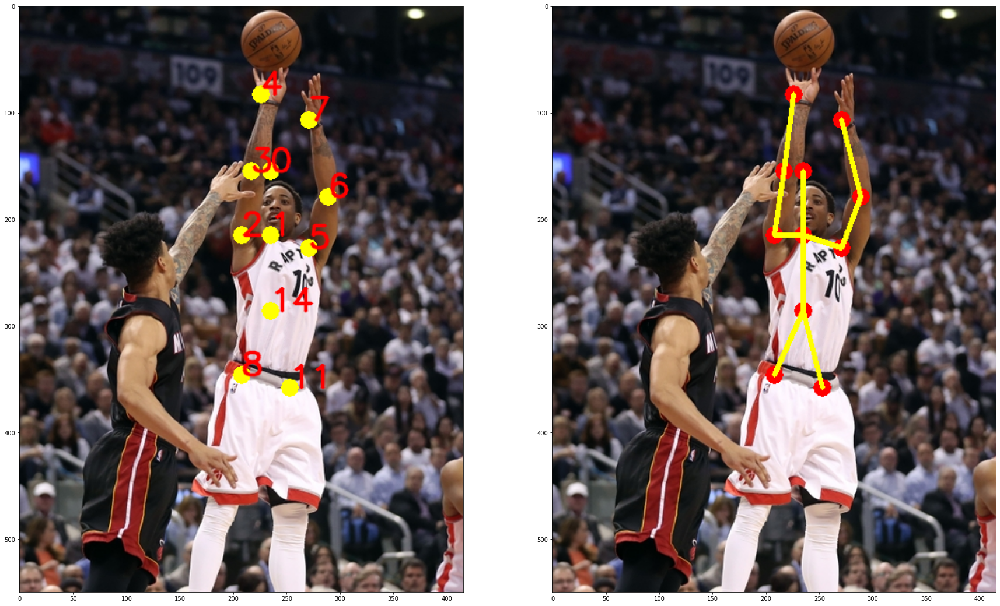

In [27]:
keyPoints = getPoseEstimation("curry5", 0.2, [2,3,4])
keyPoints = getPoseEstimation("giannis11", 0.2, [2,3,4])
keyPoints = getPoseEstimation("demar10", 0.3, [2,3,4])